In [ ]:
#downloading the data set
!rm -rf /content/inaturalist_12K
!wget -O nature_12K.zip "https://storage.googleapis.com/wandb_datasets/nature_12K.zip"
!unzip nature_12K.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/inaturalist_12K/train/Arachnida/1ac25349af662e85f577a31f64beca41.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/117ef7f1812725f359500448a258e713.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/6409254954c3b46d88d64f0bf4c632fa.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/aaed865750bd52944658a7dd23366948.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/460cc09ef510d400a4d47a836ddd45e6.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/55c48c3afef0b745e53951284cdb2db4.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/bff3daa961ee96a37ebe12dc0bcce504.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/9082d4f2107bccf1f14d71c8944be607.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/93d0130423d42f7c6228150eb95a2a93.jpg  
  inflating: /content/inaturalist_12K/train/Arachnida/051aba6d7bc324bad76bd438ed3cc276.jpg  
  inflating: /conte

In [ ]:
!rm -rf /content/inaturalist_12K/train/.DS_Store

In [ ]:
from torchvision.io import read_image
im=read_image('/content/inaturalist_12K/train/Amphibia/0012ec13b97dfbfb3dd5de8c3da95555.jpg')
im.shape  #knowing the image dimensions like height, width, and number of channels

torch.Size([3, 600, 800])

In [ ]:
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(512 * 7 * 7, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))
        x = self.pool(F.relu(self.bn5(self.conv5(x))))
        x = x.view(-1, 512 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:

num_classes = 10
model = CustomCNN(num_classes)

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [ ]:
num_epochs = 10
train_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/train') #Train data
# Data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}')


In [ ]:
import os
import random
import shutil


train_dir = '/content/inaturalist_12K/train'
val_dir = '/content/inaturalist_12K/val'
test_dir = '/content/inaturalist_12K/test'

# creating the test_dir if doesn't exist
os.makedirs(test_dir, exist_ok=True)

# Geting list of all classes
classes = os.listdir(train_dir)

# Move 20% of files from each class in the train directory to the training directory
for cls in classes:
    cls_train_dir = os.path.join(train_dir, cls)
    cls_val_dir = os.path.join(test_dir, cls)
    os.makedirs(cls_val_dir, exist_ok=True)

    # Listing all files in the class directory
    files = os.listdir(cls_train_dir)
    random.shuffle(files)


    num_val_files = int(0.2 * len(files)) #moving 20 percent of the files from train to testing
    val_files = files[:num_val_files]


    for file in val_files:
        shutil.move(os.path.join(cls_train_dir, file), os.path.join(cls_val_dir, file))


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader


In [ ]:
# Data augmentation and normalization for training
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),    #flips the images horizontally
    transforms.RandomRotation(10),        #Rotates the image by a specifies angle(10)
    transforms.RandomResizedCrop(224),    #Resizes the input image to the specified size
    transforms.ToTensor(),                #Finally converting to tensor format
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Normalization for validation/testing
test_transforms = transforms.Compose([
    transforms.Resize(256),           #Resizing the image
    transforms.CenterCrop(224),       #croping the image with specified size
    transforms.ToTensor(),            #converting to tensor format
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])


train_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/train', transform=train_transforms) #Train data
test_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/test', transform=test_transforms)#validation data

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


In [ ]:
!pip install wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 20.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 303.6/303.6 kB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.7 MB/s eta 0:00:00


In [ ]:
import wandb
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader


wandb.init(project='inaturalist-hyperparameter-sweep') #naming the project


sweep_configuration = {  #Different hyper parameters with a target of achieving maximum accuracy
    'method': 'random',
    'metric': {
        'name': 'accuracy',
        'goal': 'maximize'
    },
    'parameters': {
        'learning_rate': {
            'values': [0.1, 0.01, 0.001, 0.0001]
        },
        'batch_size': {
            'values': [32, 64, 128]
        },
        'num_epochs': {
            'values': [10, 20, 30]
        }
    }
}

sweep_id = wandb.sweep(sweep=sweep_configuration, project='inaturalist-hyperparameter-sweep') #Generating an Id for the sweep


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: x1tpnqcb
Sweep URL: https://wandb.ai/warfieldashlee541-teachers-pay-teachers/inaturalist-hyperparameter-sweep/sweeps/x1tpnqcb


In [ ]:
import wandb
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


sweep_configuration = {
    'method': 'random',
    'metric': {
        'name': 'loss',
        'goal': 'minimize'
    },
    'parameters': {
        'learning_rate': {
            'values': [0.1, 0.01, 0.001, 0.0001]
        },
        'batch_size': {
            'values': [32, 64, 128]
        },
        'num_epochs': {
            'values': [10, 20, 30]
        }
    }
}


sweep_id = wandb.sweep(sweep=sweep_configuration, project='inaturalist-hyperparameter-sweep')

def train(config=None):
    with wandb.init(config=config):
        config = wandb.config

        # Data augmentation and loaders
        train_transforms = transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(10),
            transforms.RandomResizedCrop(224),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        ])
        train_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/train', transform=train_transforms)
        test_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/test', transform=test_transforms)
        train_loader = DataLoader(train_dataset, batch_size=config.batch_size, shuffle=True, num_workers=2)
        test_loader = DataLoader(test_dataset, batch_size=config.batch_size, shuffle=False, num_workers=2)

        # Defining CNN model
        class CustomCNN(nn.Module):
            def __init__(self, num_classes):
                super(CustomCNN, self).__init__()
                self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
                self.bn1 = nn.BatchNorm2d(32)
                self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
                self.bn2 = nn.BatchNorm2d(64)
                self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
                self.bn3 = nn.BatchNorm2d(128)
                self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
                self.bn4 = nn.BatchNorm2d(256)
                self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
                self.bn5 = nn.BatchNorm2d(512)
                self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
                self.fc1 = nn.Linear(512 * 7 * 7, 512)
                self.fc2 = nn.Linear(512, 10)

            def forward(self, x):
                x = self.pool(F.relu(self.bn1(self.conv1(x))))
                x = self.pool(F.relu(self.bn2(self.conv2(x))))
                x = self.pool(F.relu(self.bn3(self.conv3(x))))
                x = self.pool(F.relu(self.bn4(self.conv4(x))))
                x = self.pool(F.relu(self.bn5(self.conv5(x))))
                x = x.view(-1, 512 * 7 * 7)
                x = F.relu(self.fc1(x))
                x = self.fc2(x)
                return x

        # Initializing model, loss, optimizer
        model = CustomCNN(num_classes=10).to(device)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)

        # Training loop
        for epoch in range(config.num_epochs):
            model.train()
            running_loss = 0.0
            for inputs, labels in train_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                running_loss += loss.item()

            wandb.log({'epoch': epoch + 1, 'loss': running_loss / len(train_loader)})


            print(f'Epoch [{epoch + 1}/{config.num_epochs}], Loss: {running_loss / len(train_loader):.4f}')


wandb.agent(sweep_id, function=train) #Initializing the sweep with the generated sweep Id


Error in callback <bound method _WandbInit._resume_backend of <wandb.sdk.wandb_init._WandbInit object at 0x7f1abcdadd80>> (for pre_run_cell):


BrokenPipeError: [Errno 32] Broken pipe

Create sweep with ID: 6zas4xf6
Sweep URL: https://wandb.ai/warfieldashlee541-teachers-pay-teachers/inaturalist-hyperparameter-sweep/sweeps/6zas4xf6


wandb: Agent Starting Run: 4egir4d0 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 10


Epoch [1/10], Loss: 1736.9536
Epoch [2/10], Loss: 3.1121
Epoch [3/10], Loss: 2.3150
Epoch [4/10], Loss: 2.3101
Epoch [5/10], Loss: 2.3158
Epoch [6/10], Loss: 2.3127
Epoch [7/10], Loss: 2.3130
Epoch [8/10], Loss: 2.3118
Epoch [9/10], Loss: 2.3103
Epoch [10/10], Loss: 2.3112


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▁▁▁▁▁▁▁▁▁
epoch,10
loss,2.31115


wandb: Agent Starting Run: n4l7ij0w with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2.3740
Epoch [2/20], Loss: 2.0607
Epoch [3/20], Loss: 1.9504
Epoch [4/20], Loss: 1.8498
Epoch [5/20], Loss: 1.8437
Epoch [6/20], Loss: 1.7523
Epoch [7/20], Loss: 1.7470
Epoch [8/20], Loss: 1.7217
Epoch [9/20], Loss: 1.6814
Epoch [10/20], Loss: 1.6382
Epoch [11/20], Loss: 1.6080
Epoch [12/20], Loss: 1.5940
Epoch [13/20], Loss: 1.5649
Epoch [14/20], Loss: 1.5422
Epoch [15/20], Loss: 1.5320
Epoch [16/20], Loss: 1.5006
Epoch [17/20], Loss: 1.4897
Epoch [18/20], Loss: 1.4644
Epoch [19/20], Loss: 1.5128
Epoch [20/20], Loss: 1.4438


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▂▁
epoch,20
loss,1.4438


wandb: Agent Starting Run: sfzbh22u with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2.4330
Epoch [2/20], Loss: 2.1014
Epoch [3/20], Loss: 1.9829
Epoch [4/20], Loss: 1.8916
Epoch [5/20], Loss: 1.8058
Epoch [6/20], Loss: 1.7689
Epoch [7/20], Loss: 1.7373
Epoch [8/20], Loss: 1.7157
Epoch [9/20], Loss: 1.6837
Epoch [10/20], Loss: 1.6433
Epoch [11/20], Loss: 1.6391
Epoch [12/20], Loss: 1.6275
Epoch [13/20], Loss: 1.5753
Epoch [14/20], Loss: 1.5544
Epoch [15/20], Loss: 1.5418
Epoch [16/20], Loss: 1.5664
Epoch [17/20], Loss: 1.5214
Epoch [18/20], Loss: 1.5377
Epoch [19/20], Loss: 1.4780
Epoch [20/20], Loss: 1.4567


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▁▂▁▁
epoch,20
loss,1.45665


wandb: Agent Starting Run: lsbpx64p with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.001
wandb: 	num_epochs: 10


Epoch [1/10], Loss: 12.5435
Epoch [2/10], Loss: 4.4859
Epoch [3/10], Loss: 2.4830
Epoch [4/10], Loss: 2.2466
Epoch [5/10], Loss: 2.2066
Epoch [6/10], Loss: 2.1865
Epoch [7/10], Loss: 2.1753
Epoch [8/10], Loss: 2.1641
Epoch [9/10], Loss: 2.1671
Epoch [10/10], Loss: 2.1404


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▃▁▁▁▁▁▁▁▁
epoch,10
loss,2.14042


wandb: Agent Starting Run: cq7czrgg with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 10


Epoch [1/10], Loss: 948.7349
Epoch [2/10], Loss: 2.6299
Epoch [3/10], Loss: 2.3164
Epoch [4/10], Loss: 2.3127
Epoch [5/10], Loss: 2.3297
Epoch [6/10], Loss: 2.3174
Epoch [7/10], Loss: 2.3153
Epoch [8/10], Loss: 2.3168
Epoch [9/10], Loss: 2.3163
Epoch [10/10], Loss: 2.3124


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▁▁▁▁▁▁▁▁▁
epoch,10
loss,2.31242


wandb: Agent Starting Run: srm9exjb with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2516.2046
Epoch [2/20], Loss: 9.0820
Epoch [3/20], Loss: 2.7305
Epoch [4/20], Loss: 2.4671
Epoch [5/20], Loss: 2.3366
Epoch [6/20], Loss: 2.3101
Epoch [7/20], Loss: 2.3578
Epoch [8/20], Loss: 2.2900
Epoch [9/20], Loss: 2.3152
Epoch [10/20], Loss: 2.3014
Epoch [11/20], Loss: 2.2887
Epoch [12/20], Loss: 2.3092
Epoch [13/20], Loss: 2.2915
Epoch [14/20], Loss: 2.2954
Epoch [15/20], Loss: 2.2859
Epoch [16/20], Loss: 2.2787
Epoch [17/20], Loss: 2.2855
Epoch [18/20], Loss: 2.2831
Epoch [19/20], Loss: 2.2747
Epoch [20/20], Loss: 2.2778


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,2.27779


wandb: Agent Starting Run: 5lbrs9rd with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 6.6076
Epoch [2/20], Loss: 2.4745
Epoch [3/20], Loss: 2.2344
Epoch [4/20], Loss: 2.1806
Epoch [5/20], Loss: 2.1557
Epoch [6/20], Loss: 2.1318
Epoch [7/20], Loss: 2.0710
Epoch [8/20], Loss: 2.0196
Epoch [9/20], Loss: 1.9646
Epoch [10/20], Loss: 1.9479
Epoch [11/20], Loss: 1.9174
Epoch [12/20], Loss: 1.9072
Epoch [13/20], Loss: 1.8914
Epoch [14/20], Loss: 1.8327
Epoch [15/20], Loss: 1.8449
Epoch [16/20], Loss: 1.8133
Epoch [17/20], Loss: 1.7971
Epoch [18/20], Loss: 1.8364
Epoch [19/20], Loss: 1.7790
Epoch [20/20], Loss: 1.7364


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,1.73639


wandb: Agent Starting Run: q2i095iw with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2.4602
Epoch [2/20], Loss: 2.0943
Epoch [3/20], Loss: 1.9472
Epoch [4/20], Loss: 1.8537
Epoch [5/20], Loss: 1.8158
Epoch [6/20], Loss: 1.7922
Epoch [7/20], Loss: 1.6975
Epoch [8/20], Loss: 1.6972
Epoch [9/20], Loss: 1.6369
Epoch [10/20], Loss: 1.6133
Epoch [11/20], Loss: 1.5791
Epoch [12/20], Loss: 1.5751
Epoch [13/20], Loss: 1.5639
Epoch [14/20], Loss: 1.5254
Epoch [15/20], Loss: 1.5045
Epoch [16/20], Loss: 1.4782
Epoch [17/20], Loss: 1.4802
Epoch [18/20], Loss: 1.4578
Epoch [19/20], Loss: 1.4135
Epoch [20/20], Loss: 1.4131


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▆▅▄▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁
epoch,20
loss,1.41305


wandb: Agent Starting Run: tl0rlws3 with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 3653.6201
Epoch [2/30], Loss: 35.4705
Epoch [3/30], Loss: 2.3340
Epoch [4/30], Loss: 2.3494
Epoch [5/30], Loss: 2.3160
Epoch [6/30], Loss: 2.3045
Epoch [7/30], Loss: 2.3071
Epoch [8/30], Loss: 2.3057
Epoch [9/30], Loss: 2.3090
Epoch [10/30], Loss: 2.3062
Epoch [11/30], Loss: 2.3064
Epoch [12/30], Loss: 2.3057
Epoch [13/30], Loss: 2.3066
Epoch [14/30], Loss: 2.3037
Epoch [15/30], Loss: 2.3081
Epoch [16/30], Loss: 2.3077
Epoch [17/30], Loss: 2.3060
Epoch [18/30], Loss: 2.3061
Epoch [19/30], Loss: 2.3061
Epoch [20/30], Loss: 2.3053
Epoch [21/30], Loss: 2.3059
Epoch [22/30], Loss: 2.3037
Epoch [23/30], Loss: 2.3056
Epoch [24/30], Loss: 2.3061
Epoch [25/30], Loss: 2.3032
Epoch [26/30], Loss: 2.3031
Epoch [27/30], Loss: 2.3037
Epoch [28/30], Loss: 2.3063
Epoch [29/30], Loss: 2.3066
Epoch [30/30], Loss: 2.3105


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
loss,2.31052


wandb: Agent Starting Run: tdy4gniq with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 63.5013
Epoch [2/30], Loss: 2.4200
Epoch [3/30], Loss: 2.3335
Epoch [4/30], Loss: 2.3534
Epoch [5/30], Loss: 2.3122
Epoch [6/30], Loss: 2.3521
Epoch [7/30], Loss: 2.3170
Epoch [8/30], Loss: 2.3018
Epoch [9/30], Loss: 2.3033
Epoch [10/30], Loss: 2.3061
Epoch [11/30], Loss: 2.3032
Epoch [12/30], Loss: 2.3033
Epoch [13/30], Loss: 2.2991
Epoch [14/30], Loss: 2.3072
Epoch [15/30], Loss: 2.3032
Epoch [16/30], Loss: 2.3034
Epoch [17/30], Loss: 2.3030
Epoch [18/30], Loss: 2.3034
Epoch [19/30], Loss: 2.3031
Epoch [20/30], Loss: 2.3032
Epoch [21/30], Loss: 2.3036
Epoch [22/30], Loss: 2.3031
Epoch [23/30], Loss: 2.3031
Epoch [24/30], Loss: 2.3035
Epoch [25/30], Loss: 2.3031
Epoch [26/30], Loss: 2.3035
Epoch [27/30], Loss: 2.3037
Epoch [28/30], Loss: 2.3033
Epoch [29/30], Loss: 2.3035
Epoch [30/30], Loss: 2.3031


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
loss,2.30313


wandb: Agent Starting Run: zhkdb8hg with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.001
wandb: 	num_epochs: 10


Epoch [1/10], Loss: 6.5546
Epoch [2/10], Loss: 2.6019
Epoch [3/10], Loss: 2.3454
Epoch [4/10], Loss: 2.2815
Epoch [5/10], Loss: 2.2184
Epoch [6/10], Loss: 2.1819
Epoch [7/10], Loss: 2.1390
Epoch [8/10], Loss: 2.1170
Epoch [9/10], Loss: 2.1103
Epoch [10/10], Loss: 2.0575


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▂▁▁▁▁▁▁▁▁
epoch,10
loss,2.05745


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: polz6xqr with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 10


Epoch [1/10], Loss: 2.7030
Epoch [2/10], Loss: 2.2123
Epoch [3/10], Loss: 2.0975
Epoch [4/10], Loss: 2.0163
Epoch [5/10], Loss: 1.9586
Epoch [6/10], Loss: 1.8940
Epoch [7/10], Loss: 1.8033
Epoch [8/10], Loss: 1.7814
Epoch [9/10], Loss: 1.7314
Epoch [10/10], Loss: 1.6765


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▃▃▂▂▂▁▁
epoch,10
loss,1.67653


wandb: Agent Starting Run: cilyzcq8 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 2.3703
Epoch [2/30], Loss: 2.0076
Epoch [3/30], Loss: 1.9013
Epoch [4/30], Loss: 1.8111
Epoch [5/30], Loss: 1.7641
Epoch [6/30], Loss: 1.7147
Epoch [7/30], Loss: 1.7052
Epoch [8/30], Loss: 1.6533
Epoch [9/30], Loss: 1.6470
Epoch [10/30], Loss: 1.5805
Epoch [11/30], Loss: 1.5785
Epoch [12/30], Loss: 1.5502
Epoch [13/30], Loss: 1.4898
Epoch [14/30], Loss: 1.4947
Epoch [15/30], Loss: 1.5247
Epoch [16/30], Loss: 1.4735
Epoch [17/30], Loss: 1.4565
Epoch [18/30], Loss: 1.4695
Epoch [19/30], Loss: 1.4035
Epoch [20/30], Loss: 1.4335
Epoch [21/30], Loss: 1.4096
Epoch [22/30], Loss: 1.4049
Epoch [23/30], Loss: 1.3174
Epoch [24/30], Loss: 1.3249
Epoch [25/30], Loss: 1.3304
Epoch [26/30], Loss: 1.3328
Epoch [27/30], Loss: 1.2788
Epoch [28/30], Loss: 1.2864
Epoch [29/30], Loss: 1.2191
Epoch [30/30], Loss: 1.2629


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▆▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▁▁▁▁
epoch,30
loss,1.26288


wandb: Agent Starting Run: 8cl70ey0 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 9.3480
Epoch [2/20], Loss: 2.7097
Epoch [3/20], Loss: 2.3920
Epoch [4/20], Loss: 2.2781
Epoch [5/20], Loss: 2.2611
Epoch [6/20], Loss: 2.2139
Epoch [7/20], Loss: 2.2097
Epoch [8/20], Loss: 2.1611
Epoch [9/20], Loss: 2.1588
Epoch [10/20], Loss: 2.1403
Epoch [11/20], Loss: 2.1037
Epoch [12/20], Loss: 2.0581
Epoch [13/20], Loss: 2.0198
Epoch [14/20], Loss: 2.0059
Epoch [15/20], Loss: 1.9428
Epoch [16/20], Loss: 1.9329
Epoch [17/20], Loss: 1.9208
Epoch [18/20], Loss: 1.9252
Epoch [19/20], Loss: 1.8734
Epoch [20/20], Loss: 1.9090


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,1.90903


wandb: Agent Starting Run: 4gurls7j with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 10


Epoch [1/10], Loss: 926.7641
Epoch [2/10], Loss: 2.4846
Epoch [3/10], Loss: 2.3205
Epoch [4/10], Loss: 2.3187
Epoch [5/10], Loss: 2.3251
Epoch [6/10], Loss: 2.3187
Epoch [7/10], Loss: 2.3203
Epoch [8/10], Loss: 2.3306
Epoch [9/10], Loss: 2.3207
Epoch [10/10], Loss: 2.3166


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▁▁▁▁▁▁▁▁▁
epoch,10
loss,2.31662


wandb: Agent Starting Run: tnzpxat4 with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 153.4021
Epoch [2/30], Loss: 8.7345
Epoch [3/30], Loss: 2.4618
Epoch [4/30], Loss: 2.3366
Epoch [5/30], Loss: 2.3131
Epoch [6/30], Loss: 2.3060
Epoch [7/30], Loss: 2.3038
Epoch [8/30], Loss: 2.3064
Epoch [9/30], Loss: 2.3059
Epoch [10/30], Loss: 2.3020
Epoch [11/30], Loss: 2.3043
Epoch [12/30], Loss: 2.2997
Epoch [13/30], Loss: 2.3026
Epoch [14/30], Loss: 2.3030
Epoch [15/30], Loss: 2.3098
Epoch [16/30], Loss: 2.3039
Epoch [17/30], Loss: 2.3027
Epoch [18/30], Loss: 2.3023
Epoch [19/30], Loss: 2.3026
Epoch [20/30], Loss: 2.3026
Epoch [21/30], Loss: 2.3028
Epoch [22/30], Loss: 2.3027
Epoch [23/30], Loss: 2.3003
Epoch [24/30], Loss: 2.3122
Epoch [25/30], Loss: 2.3486
Epoch [26/30], Loss: 2.3029
Epoch [27/30], Loss: 2.3030
Epoch [28/30], Loss: 2.3027
Epoch [29/30], Loss: 2.3029
Epoch [30/30], Loss: 2.3028


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
loss,2.30278


wandb: Agent Starting Run: n9ko2urc with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 6.8174
Epoch [2/20], Loss: 2.3154
Epoch [3/20], Loss: 2.2531
Epoch [4/20], Loss: 2.2065
Epoch [5/20], Loss: 2.1607
Epoch [6/20], Loss: 2.0726
Epoch [7/20], Loss: 2.0608
Epoch [8/20], Loss: 2.0134
Epoch [9/20], Loss: 1.9911
Epoch [10/20], Loss: 1.9413
Epoch [11/20], Loss: 1.9295
Epoch [12/20], Loss: 1.8865
Epoch [13/20], Loss: 1.8986
Epoch [14/20], Loss: 1.9126
Epoch [15/20], Loss: 1.8070
Epoch [16/20], Loss: 1.8316
Epoch [17/20], Loss: 1.8179
Epoch [18/20], Loss: 1.8211
Epoch [19/20], Loss: 1.7859
Epoch [20/20], Loss: 1.7723


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,1.7723


wandb: Agent Starting Run: vpz2xjeb with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 29.1537
Epoch [2/20], Loss: 2.3606
Epoch [3/20], Loss: 2.3057
Epoch [4/20], Loss: 2.3102
Epoch [5/20], Loss: 2.3038
Epoch [6/20], Loss: 2.3040
Epoch [7/20], Loss: 2.3038
Epoch [8/20], Loss: 2.3040
Epoch [9/20], Loss: 2.3303
Epoch [10/20], Loss: 2.3053
Epoch [11/20], Loss: 2.3257
Epoch [12/20], Loss: 2.3044
Epoch [13/20], Loss: 2.3031
Epoch [14/20], Loss: 2.3085
Epoch [15/20], Loss: 2.3044
Epoch [16/20], Loss: 2.3048
Epoch [17/20], Loss: 2.3039
Epoch [18/20], Loss: 2.3043
Epoch [19/20], Loss: 2.3044
Epoch [20/20], Loss: 2.3047


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,2.30473


wandb: Agent Starting Run: 9k1mnd9e with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 5.4779
Epoch [2/20], Loss: 2.2569
Epoch [3/20], Loss: 2.1853
Epoch [4/20], Loss: 2.1565
Epoch [5/20], Loss: 2.1391
Epoch [6/20], Loss: 2.0615
Epoch [7/20], Loss: 2.0552
Epoch [8/20], Loss: 2.0221
Epoch [9/20], Loss: 1.9919
Epoch [10/20], Loss: 1.9407
Epoch [11/20], Loss: 1.9750
Epoch [12/20], Loss: 1.9362
Epoch [13/20], Loss: 1.9199
Epoch [14/20], Loss: 1.8891
Epoch [15/20], Loss: 1.8947
Epoch [16/20], Loss: 1.8414
Epoch [17/20], Loss: 1.8246
Epoch [18/20], Loss: 1.8247
Epoch [19/20], Loss: 1.8390
Epoch [20/20], Loss: 1.8367


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,1.83667


wandb: Agent Starting Run: njf2xt3e with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 62.0802
Epoch [2/20], Loss: 2.3857
Epoch [3/20], Loss: 2.3119
Epoch [4/20], Loss: 2.3118
Epoch [5/20], Loss: 2.3317
Epoch [6/20], Loss: 2.3124
Epoch [7/20], Loss: 2.3029
Epoch [8/20], Loss: 2.3023
Epoch [9/20], Loss: 2.3007
Epoch [10/20], Loss: 2.3162
Epoch [11/20], Loss: 2.3020
Epoch [12/20], Loss: 2.3031
Epoch [13/20], Loss: 2.3024
Epoch [14/20], Loss: 2.3040
Epoch [15/20], Loss: 2.3010
Epoch [16/20], Loss: 2.3644
Epoch [17/20], Loss: 2.2991
Epoch [18/20], Loss: 2.3057
Epoch [19/20], Loss: 2.3021
Epoch [20/20], Loss: 2.3045


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,2.30452


wandb: Agent Starting Run: wabciwnq with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 42.6604
Epoch [2/30], Loss: 2.3039
Epoch [3/30], Loss: 2.3034
Epoch [4/30], Loss: 2.3033
Epoch [5/30], Loss: 2.3036
Epoch [6/30], Loss: 2.3039
Epoch [7/30], Loss: 2.3034
Epoch [8/30], Loss: 2.3038
Epoch [9/30], Loss: 2.3037
Epoch [10/30], Loss: 2.3036
Epoch [11/30], Loss: 2.3040
Epoch [12/30], Loss: 2.3040
Epoch [13/30], Loss: 2.3040
Epoch [14/30], Loss: 2.3046
Epoch [15/30], Loss: 2.3044
Epoch [16/30], Loss: 2.3038
Epoch [17/30], Loss: 2.3039
Epoch [18/30], Loss: 2.3046
Epoch [19/30], Loss: 2.3042
Epoch [20/30], Loss: 2.3039
Epoch [21/30], Loss: 2.3040
Epoch [22/30], Loss: 2.3044
Epoch [23/30], Loss: 2.3045
Epoch [24/30], Loss: 2.3041
Epoch [25/30], Loss: 2.3040
Epoch [26/30], Loss: 2.3041
Epoch [27/30], Loss: 2.3041
Epoch [28/30], Loss: 2.3038
Epoch [29/30], Loss: 2.3039
Epoch [30/30], Loss: 2.3042


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
loss,2.30419


wandb: Agent Starting Run: 7lx7i0wp with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 2.4273
Epoch [2/30], Loss: 2.1031
Epoch [3/30], Loss: 2.0058
Epoch [4/30], Loss: 1.8991
Epoch [5/30], Loss: 1.8447
Epoch [6/30], Loss: 1.7722
Epoch [7/30], Loss: 1.7525
Epoch [8/30], Loss: 1.6598
Epoch [9/30], Loss: 1.7042
Epoch [10/30], Loss: 1.6620
Epoch [11/30], Loss: 1.6765
Epoch [12/30], Loss: 1.5851
Epoch [13/30], Loss: 1.6107
Epoch [14/30], Loss: 1.5612
Epoch [15/30], Loss: 1.5544
Epoch [16/30], Loss: 1.5379
Epoch [17/30], Loss: 1.5193
Epoch [18/30], Loss: 1.4859
Epoch [19/30], Loss: 1.4497
Epoch [20/30], Loss: 1.4810
Epoch [21/30], Loss: 1.4276
Epoch [22/30], Loss: 1.4093
Epoch [23/30], Loss: 1.3939
Epoch [24/30], Loss: 1.4180
Epoch [25/30], Loss: 1.3952
Epoch [26/30], Loss: 1.3649
Epoch [27/30], Loss: 1.3784
Epoch [28/30], Loss: 1.3724
Epoch [29/30], Loss: 1.3393
Epoch [30/30], Loss: 1.3101


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▆▅▅▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
epoch,30
loss,1.31013


wandb: Agent Starting Run: c078wfnd with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 2.3991
Epoch [2/30], Loss: 2.0677
Epoch [3/30], Loss: 1.9892
Epoch [4/30], Loss: 1.8881
Epoch [5/30], Loss: 1.8084
Epoch [6/30], Loss: 1.7907
Epoch [7/30], Loss: 1.7235
Epoch [8/30], Loss: 1.7496
Epoch [9/30], Loss: 1.6723
Epoch [10/30], Loss: 1.6254
Epoch [11/30], Loss: 1.6292
Epoch [12/30], Loss: 1.6061
Epoch [13/30], Loss: 1.5855
Epoch [14/30], Loss: 1.5616
Epoch [15/30], Loss: 1.5128
Epoch [16/30], Loss: 1.5088
Epoch [17/30], Loss: 1.5164
Epoch [18/30], Loss: 1.4809
Epoch [19/30], Loss: 1.4506
Epoch [20/30], Loss: 1.4456
Epoch [21/30], Loss: 1.4409
Epoch [22/30], Loss: 1.4305
Epoch [23/30], Loss: 1.3566
Epoch [24/30], Loss: 1.4043
Epoch [25/30], Loss: 1.3261
Epoch [26/30], Loss: 1.3395
Epoch [27/30], Loss: 1.3417
Epoch [28/30], Loss: 1.3308
Epoch [29/30], Loss: 1.2969
Epoch [30/30], Loss: 1.2900


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁
epoch,30
loss,1.28996


wandb: Agent Starting Run: 2a68hl8i with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2.6036
Epoch [2/20], Loss: 2.1119
Epoch [3/20], Loss: 1.9921
Epoch [4/20], Loss: 1.9017
Epoch [5/20], Loss: 1.8246
Epoch [6/20], Loss: 1.7806
Epoch [7/20], Loss: 1.7147
Epoch [8/20], Loss: 1.7126
Epoch [9/20], Loss: 1.6814
Epoch [10/20], Loss: 1.6124
Epoch [11/20], Loss: 1.6025
Epoch [12/20], Loss: 1.5642
Epoch [13/20], Loss: 1.5563
Epoch [14/20], Loss: 1.5019
Epoch [15/20], Loss: 1.4981
Epoch [16/20], Loss: 1.4955
Epoch [17/20], Loss: 1.4888
Epoch [18/20], Loss: 1.4657
Epoch [19/20], Loss: 1.3966
Epoch [20/20], Loss: 1.4256


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁
epoch,20
loss,1.42562


wandb: Agent Starting Run: prmfecvw with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 10


Epoch [1/10], Loss: 70.0169
Epoch [2/10], Loss: 2.3057
Epoch [3/10], Loss: 2.3033
Epoch [4/10], Loss: 2.3032
Epoch [5/10], Loss: 2.3030
Epoch [6/10], Loss: 2.3033
Epoch [7/10], Loss: 2.3029
Epoch [8/10], Loss: 2.3030
Epoch [9/10], Loss: 2.3032
Epoch [10/10], Loss: 2.3031


epoch,▁▂▃▃▄▅▆▆▇█
loss,█▁▁▁▁▁▁▁▁▁
epoch,10
loss,2.30307


wandb: Agent Starting Run: djj9cwvr with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2.3448
Epoch [2/20], Loss: 2.0496
Epoch [3/20], Loss: 1.9344
Epoch [4/20], Loss: 1.8602
Epoch [5/20], Loss: 1.8143
Epoch [6/20], Loss: 1.7522
Epoch [7/20], Loss: 1.7243
Epoch [8/20], Loss: 1.6798
Epoch [9/20], Loss: 1.6690
Epoch [10/20], Loss: 1.6445
Epoch [11/20], Loss: 1.6084
Epoch [12/20], Loss: 1.6128
Epoch [13/20], Loss: 1.5514
Epoch [14/20], Loss: 1.5631
Epoch [15/20], Loss: 1.5239
Epoch [16/20], Loss: 1.5235
Epoch [17/20], Loss: 1.4813
Epoch [18/20], Loss: 1.4991
Epoch [19/20], Loss: 1.4704
Epoch [20/20], Loss: 1.4609


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▆▅▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch,20
loss,1.46092


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 4pbdtnra with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 2.3645
Epoch [2/30], Loss: 2.0849
Epoch [3/30], Loss: 1.9840
Epoch [4/30], Loss: 1.8818
Epoch [5/30], Loss: 1.8106
Epoch [6/30], Loss: 1.7798
Epoch [7/30], Loss: 1.7580
Epoch [8/30], Loss: 1.7111
Epoch [9/30], Loss: 1.6956
Epoch [10/30], Loss: 1.6687
Epoch [11/30], Loss: 1.6251
Epoch [12/30], Loss: 1.6622
Epoch [13/30], Loss: 1.6102
Epoch [14/30], Loss: 1.5659
Epoch [15/30], Loss: 1.5658
Epoch [16/30], Loss: 1.5325
Epoch [17/30], Loss: 1.5146
Epoch [18/30], Loss: 1.5014
Epoch [19/30], Loss: 1.4989
Epoch [20/30], Loss: 1.4841
Epoch [21/30], Loss: 1.4106
Epoch [22/30], Loss: 1.4612
Epoch [23/30], Loss: 1.3993
Epoch [24/30], Loss: 1.4361
Epoch [25/30], Loss: 1.3915
Epoch [26/30], Loss: 1.3555
Epoch [27/30], Loss: 1.3936
Epoch [28/30], Loss: 1.3454
Epoch [29/30], Loss: 1.3457
Epoch [30/30], Loss: 1.2943


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▆▆▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁
epoch,30
loss,1.29425


wandb: Agent Starting Run: yq7jtvti with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2.5618
Epoch [2/20], Loss: 2.1472
Epoch [3/20], Loss: 2.0149
Epoch [4/20], Loss: 1.9067
Epoch [5/20], Loss: 1.8432
Epoch [6/20], Loss: 1.8206
Epoch [7/20], Loss: 1.7576
Epoch [8/20], Loss: 1.7023
Epoch [9/20], Loss: 1.6839
Epoch [10/20], Loss: 1.6501
Epoch [11/20], Loss: 1.5964
Epoch [12/20], Loss: 1.5998
Epoch [13/20], Loss: 1.6034
Epoch [14/20], Loss: 1.5813
Epoch [15/20], Loss: 1.5199
Epoch [16/20], Loss: 1.5322
Epoch [17/20], Loss: 1.5293
Epoch [18/20], Loss: 1.4980
Epoch [19/20], Loss: 1.4777
Epoch [20/20], Loss: 1.4691


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▅▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch,20
loss,1.46907


wandb: Agent Starting Run: pefb1uu3 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 79.0828
Epoch [2/20], Loss: 2.3646
Epoch [3/20], Loss: 2.3147
Epoch [4/20], Loss: 2.3033
Epoch [5/20], Loss: 2.3032
Epoch [6/20], Loss: 2.3102
Epoch [7/20], Loss: 2.3034
Epoch [8/20], Loss: 2.3206
Epoch [9/20], Loss: 2.3029
Epoch [10/20], Loss: 2.3032
Epoch [11/20], Loss: 2.3029
Epoch [12/20], Loss: 2.3032
Epoch [13/20], Loss: 2.3030
Epoch [14/20], Loss: 2.3030
Epoch [15/20], Loss: 2.3031
Epoch [16/20], Loss: 2.3026
Epoch [17/20], Loss: 2.3027
Epoch [18/20], Loss: 2.3034
Epoch [19/20], Loss: 2.3032
Epoch [20/20], Loss: 2.3037


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,2.30365


wandb: Agent Starting Run: 604rlwh4 with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 2.5739
Epoch [2/20], Loss: 2.1410
Epoch [3/20], Loss: 1.9986
Epoch [4/20], Loss: 1.9033
Epoch [5/20], Loss: 1.8423
Epoch [6/20], Loss: 1.7707
Epoch [7/20], Loss: 1.7111
Epoch [8/20], Loss: 1.7053
Epoch [9/20], Loss: 1.6747
Epoch [10/20], Loss: 1.6101
Epoch [11/20], Loss: 1.6119
Epoch [12/20], Loss: 1.5988
Epoch [13/20], Loss: 1.5550
Epoch [14/20], Loss: 1.5111
Epoch [15/20], Loss: 1.5380
Epoch [16/20], Loss: 1.4819
Epoch [17/20], Loss: 1.5409
Epoch [18/20], Loss: 1.4647
Epoch [19/20], Loss: 1.4418
Epoch [20/20], Loss: 1.4054


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▅▅▄▄▃▃▃▃▂▂▂▂▂▂▁▂▁▁▁
epoch,20
loss,1.40544


wandb: Agent Starting Run: ky561be2 with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 20


Epoch [1/20], Loss: 3089.6501
Epoch [2/20], Loss: 40.6763
Epoch [3/20], Loss: 2.3901
Epoch [4/20], Loss: 2.4371
Epoch [5/20], Loss: 2.3428
Epoch [6/20], Loss: 2.3183
Epoch [7/20], Loss: 2.3227
Epoch [8/20], Loss: 2.3205
Epoch [9/20], Loss: 2.3033
Epoch [10/20], Loss: 2.3040
Epoch [11/20], Loss: 2.3089
Epoch [12/20], Loss: 2.3017
Epoch [13/20], Loss: 2.2922
Epoch [14/20], Loss: 2.3082
Epoch [15/20], Loss: 2.3072
Epoch [16/20], Loss: 2.3055
Epoch [17/20], Loss: 2.2956
Epoch [18/20], Loss: 2.2950
Epoch [19/20], Loss: 2.3011
Epoch [20/20], Loss: 2.2966


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20
loss,2.29659


wandb: Agent Starting Run: 286i385d with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 842.4126
Epoch [2/30], Loss: 2.3367
Epoch [3/30], Loss: 2.3179
Epoch [4/30], Loss: 2.3147
Epoch [5/30], Loss: 2.3877
Epoch [6/30], Loss: 2.3210
Epoch [7/30], Loss: 2.3155
Epoch [8/30], Loss: 2.3209
Epoch [9/30], Loss: 2.3186
Epoch [10/30], Loss: 2.3183
Epoch [11/30], Loss: 2.3197
Epoch [12/30], Loss: 2.3220
Epoch [13/30], Loss: 2.3268
Epoch [14/30], Loss: 2.3160
Epoch [15/30], Loss: 2.3214
Epoch [16/30], Loss: 2.4018
Epoch [17/30], Loss: 2.3183
Epoch [18/30], Loss: 2.3160
Epoch [19/30], Loss: 2.3119
Epoch [20/30], Loss: 2.3105
Epoch [21/30], Loss: 2.3166
Epoch [22/30], Loss: 2.3186
Epoch [23/30], Loss: 2.3164
Epoch [24/30], Loss: 2.3129
Epoch [25/30], Loss: 2.3144
Epoch [26/30], Loss: 2.3138
Epoch [27/30], Loss: 2.3207
Epoch [28/30], Loss: 2.3175
Epoch [29/30], Loss: 2.3186
Epoch [30/30], Loss: 2.3153


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
loss,2.31533


wandb: Agent Starting Run: zkazru6w with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.01
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 32.6071
Epoch [2/30], Loss: 2.3024
Epoch [3/30], Loss: 2.3294
Epoch [4/30], Loss: 2.3040
Epoch [5/30], Loss: 2.3039
Epoch [6/30], Loss: 2.3039
Epoch [7/30], Loss: 2.3041
Epoch [8/30], Loss: 2.3043
Epoch [9/30], Loss: 2.3038
Epoch [10/30], Loss: 2.3039
Epoch [11/30], Loss: 2.3046
Epoch [12/30], Loss: 2.3042
Epoch [13/30], Loss: 2.3054
Epoch [14/30], Loss: 2.3040
Epoch [15/30], Loss: 2.3039
Epoch [16/30], Loss: 2.3044
Epoch [17/30], Loss: 2.3039
Epoch [18/30], Loss: 2.3122
Epoch [19/30], Loss: 2.3045
Epoch [20/30], Loss: 2.3043
Epoch [21/30], Loss: 2.3041
Epoch [22/30], Loss: 2.3040
Epoch [23/30], Loss: 2.3048
Epoch [24/30], Loss: 2.3040
Epoch [25/30], Loss: 2.3038
Epoch [26/30], Loss: 2.3041
Epoch [27/30], Loss: 2.3043
Epoch [28/30], Loss: 2.3049
Epoch [29/30], Loss: 2.3057
Epoch [30/30], Loss: 2.3041


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
loss,2.30413


wandb: Agent Starting Run: utvoltg4 with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 2.3370
Epoch [2/30], Loss: 2.0977
Epoch [3/30], Loss: 1.9838
Epoch [4/30], Loss: 1.8550
Epoch [5/30], Loss: 1.8598
Epoch [6/30], Loss: 1.7836
Epoch [7/30], Loss: 1.7402
Epoch [8/30], Loss: 1.7165
Epoch [9/30], Loss: 1.6800
Epoch [10/30], Loss: 1.6506
Epoch [11/30], Loss: 1.6253
Epoch [12/30], Loss: 1.6055
Epoch [13/30], Loss: 1.5597
Epoch [14/30], Loss: 1.5949
Epoch [15/30], Loss: 1.5470
Epoch [16/30], Loss: 1.5314
Epoch [17/30], Loss: 1.5071
Epoch [18/30], Loss: 1.5246
Epoch [19/30], Loss: 1.4903
Epoch [20/30], Loss: 1.4374
Epoch [21/30], Loss: 1.4820
Epoch [22/30], Loss: 1.4198
Epoch [23/30], Loss: 1.4030
Epoch [24/30], Loss: 1.4583
Epoch [25/30], Loss: 1.4073
Epoch [26/30], Loss: 1.3848
Epoch [27/30], Loss: 1.3648
Epoch [28/30], Loss: 1.3405
Epoch [29/30], Loss: 1.3529
Epoch [30/30], Loss: 1.3702


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▆▆▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁
epoch,30
loss,1.37017


wandb: Agent Starting Run: 11ihvyrf with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.1
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 673.2879
Epoch [2/30], Loss: 2.3872
Epoch [3/30], Loss: 2.4948
Epoch [4/30], Loss: 2.4327
Epoch [5/30], Loss: 2.3460
Epoch [6/30], Loss: 2.3537
Epoch [7/30], Loss: 2.4102
Epoch [8/30], Loss: 2.3142
Epoch [9/30], Loss: 2.7895
Epoch [10/30], Loss: 2.3852
Epoch [11/30], Loss: 2.3476
Epoch [12/30], Loss: 2.3422
Epoch [13/30], Loss: 2.3427
Epoch [14/30], Loss: 2.3211
Epoch [15/30], Loss: 2.3355
Epoch [16/30], Loss: 2.3258
Epoch [17/30], Loss: 2.3177
Epoch [18/30], Loss: 2.3435
Epoch [19/30], Loss: 2.3448
Epoch [20/30], Loss: 2.3311
Epoch [21/30], Loss: 2.3131
Epoch [22/30], Loss: 2.3244
Epoch [23/30], Loss: 2.3195
Epoch [24/30], Loss: 2.3186
Epoch [25/30], Loss: 2.3132
Epoch [26/30], Loss: 2.3135
Epoch [27/30], Loss: 2.3174
Epoch [28/30], Loss: 2.3178
Epoch [29/30], Loss: 2.3185
Epoch [30/30], Loss: 2.3157


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
loss,2.31568


wandb: Agent Starting Run: k6w635kk with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.0001
wandb: 	num_epochs: 30


Epoch [1/30], Loss: 2.5364
Epoch [2/30], Loss: 2.1251
Epoch [3/30], Loss: 1.9988
Epoch [4/30], Loss: 1.9133
Epoch [5/30], Loss: 1.8651
Epoch [6/30], Loss: 1.7794
Epoch [7/30], Loss: 1.7571
Epoch [8/30], Loss: 1.7183
Epoch [9/30], Loss: 1.6901
Epoch [10/30], Loss: 1.6557
Epoch [11/30], Loss: 1.6174
Epoch [12/30], Loss: 1.6403


	batch_size: 64
    wandb: 	learning_rate: 0.001
    wandb: 	num_epochs: 20

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

#creating transforms for the training data
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

#creating transforms for the testing data
test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])


train_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/train', transform=train_transforms)
test_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/test', transform=test_transforms)


train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)

# defining a cnn model with the 5 layers
class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(512 * 7 * 7, 512)
        self.fc2 = nn.Linear(512, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))
        x = self.pool(F.relu(self.bn5(self.conv5(x))))
        x = x.view(-1, 512 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Initializing the model, loss function, and optimizer
num_classes = 10
model = CustomCNN(num_classes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training the model with the hyper parameters achieved high accuracy
num_epochs = 30
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}')


torch.save(model.state_dict(), 'best_model.pth') #Saving the model with high accuracy with specific hyperparameter combinations

print('Finished Training and Model Saved')

Epoch [1/30], Loss: 2.1854
Epoch [2/30], Loss: 2.0183
Epoch [3/30], Loss: 1.9752
Epoch [4/30], Loss: 1.9249
Epoch [5/30], Loss: 1.8969
Epoch [6/30], Loss: 1.8537
Epoch [7/30], Loss: 1.8132
Epoch [8/30], Loss: 1.7992
Epoch [9/30], Loss: 1.7785
Epoch [10/30], Loss: 1.7622
Epoch [11/30], Loss: 1.7382
Epoch [12/30], Loss: 1.7215
Epoch [13/30], Loss: 1.7182
Epoch [14/30], Loss: 1.6900
Epoch [15/30], Loss: 1.6810
Epoch [16/30], Loss: 1.6614
Epoch [17/30], Loss: 1.6454
Epoch [18/30], Loss: 1.6415
Epoch [19/30], Loss: 1.6402
Epoch [20/30], Loss: 1.6160
Epoch [21/30], Loss: 1.5997
Epoch [22/30], Loss: 1.6027
Epoch [23/30], Loss: 1.5874
Epoch [24/30], Loss: 1.5559
Epoch [25/30], Loss: 1.5559
Epoch [26/30], Loss: 1.5626
Epoch [27/30], Loss: 1.5355
Epoch [28/30], Loss: 1.5511
Epoch [29/30], Loss: 1.5174
Epoch [30/30], Loss: 1.5142
Finished Training and Model Saved


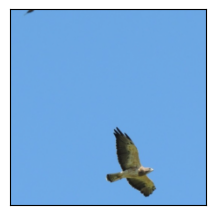

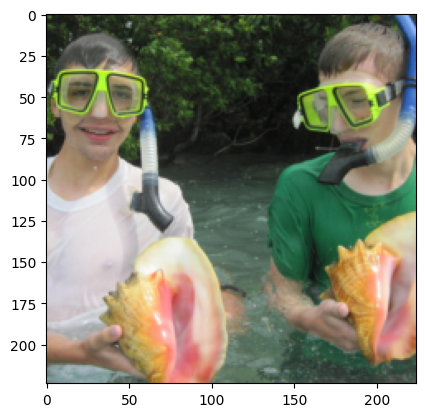

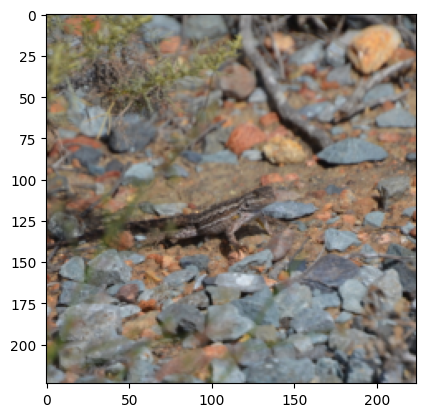

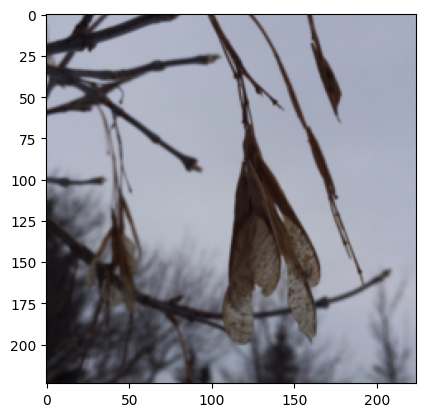

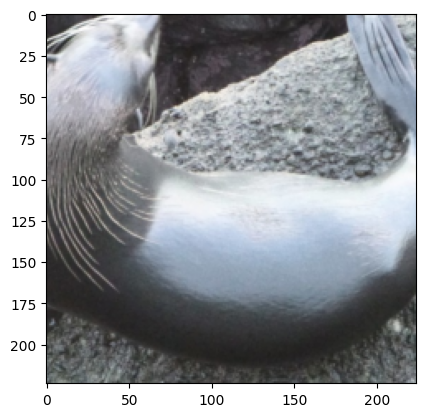

...

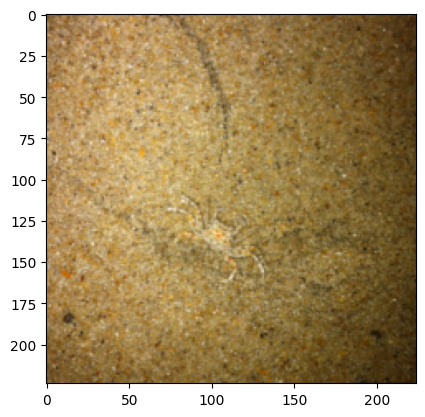

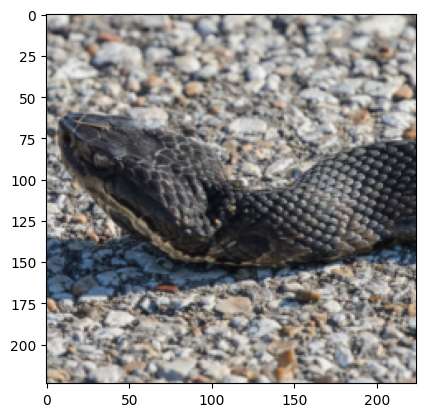

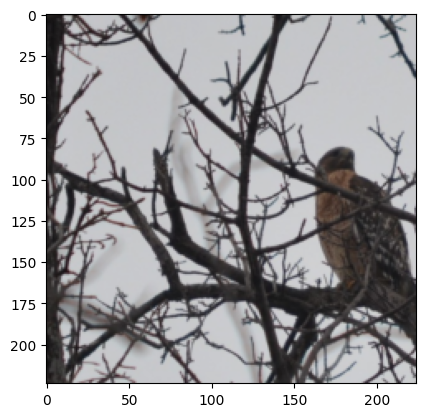

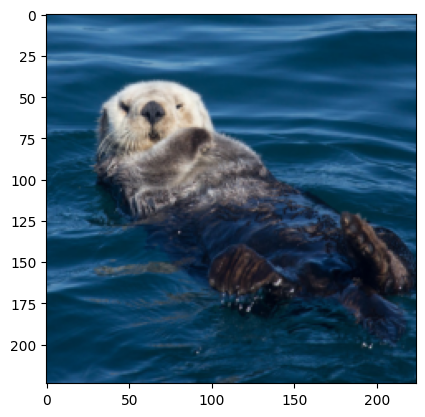

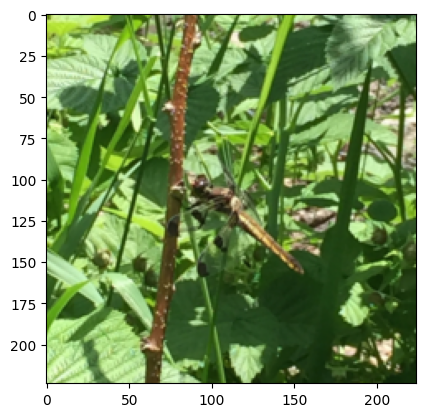

In [ ]:
import torch
from torchvision import datasets, transforms, models
import torch.nn.functional as F
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
from torch import nn

# TRansformers for validation data
test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Loading the test dataset
test_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/val', transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=30, shuffle=True, num_workers=2)

class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)#Padding adds 1pixel to each side of the input image before convolution operation
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(512 * 7 * 7, 512)
        self.fc2 = nn.Linear(512, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))
        x = self.pool(F.relu(self.bn5(self.conv5(x))))
        x = x.view(-1, 512 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

num_classes = 10
model = CustomCNN(num_classes)
model.load_state_dict(torch.load('best_model.pth'))  # Loading the saved best model using pytorch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()


images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)

# predictions are made with the model loaded
outputs = model(images)
_, preds = torch.max(outputs, 1)

# Function to display images
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)#For better plots

# Ploting the 10x3 grid
fig = plt.figure(figsize=(15, 30))
for idx in range(30):
    ax = fig.add_subplot(10, 3, idx + 1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(f'Predicted: {test_dataset.classes[preds[idx]]}\nTrue: {test_dataset.classes[labels[idx]]}')

plt.show()


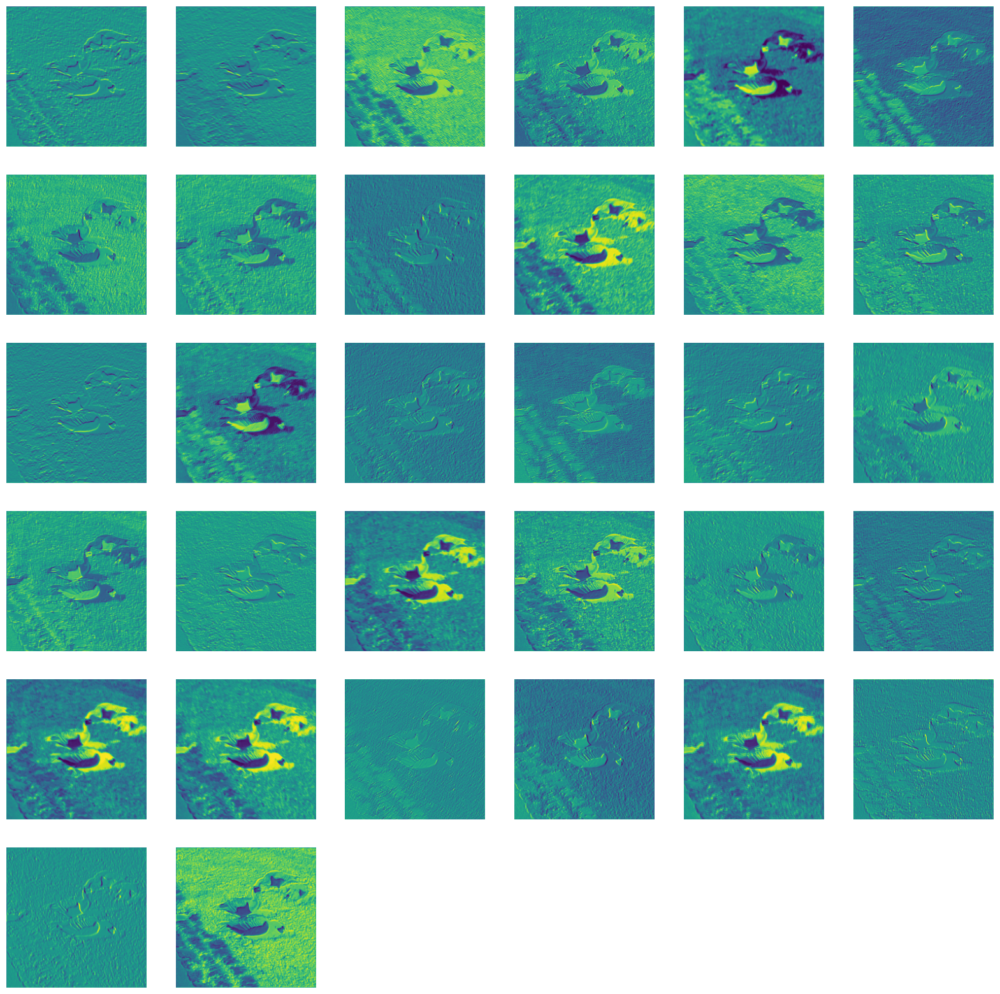

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np


test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])


test_dataset = datasets.ImageFolder(root='/content/inaturalist_12K/val', transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True, num_workers=2)

class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(512 * 7 * 7, 512)
        self.fc2 = nn.Linear(512, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))
        x = self.pool(F.relu(self.bn5(self.conv5(x))))
        x = x.view(-1, 512 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Loading the trained model
num_classes = 10
model = CustomCNN(num_classes)
model.load_state_dict(torch.load('best_model.pth'))  # loading the saved model
model.eval()

# using a random image from the test set
data_iter = iter(test_loader)
images, labels = next(data_iter)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
images = images.to(device)

# Passing the image through the first layer of the model
with torch.no_grad():
    first_layer_output = model.conv1(images)

# Moving the output to CPU for visualization as matplotlib can't handle the gpu data
first_layer_output = first_layer_output.cpu()

num_filters = first_layer_output.shape[1]

# Function to visualize the filters
def visualize_filters(filters):
    num_filters = filters.shape[1]
    grid_size = int(np.ceil(np.sqrt(num_filters)))

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20))
    for i in range(grid_size * grid_size):
        ax = axes[i // grid_size, i % grid_size]
        if i < num_filters:
            filter_image = filters[0, i].numpy()
            ax.imshow(filter_image, cmap='viridis')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.show()#shows the plot

visualize_filters(first_layer_output)
